In [194]:
import os
from warnings import warn
import scanpy as sc
import anndata as ad
import seaborn as sns
import pandas as pd

import matplotlib.pyplot as plt

from pathlib import Path, PurePath
from typing import Union, Dict, Optional, Tuple, BinaryIO

import h5py
import json
import numpy as np

from matplotlib.image import imread
from skimage import io

import anndata
from anndata import (
    AnnData,
    read_csv,
    read_text,
    read_excel,
    read_mtx,
    read_loom,
    read_hdf,
)
from anndata import read as read_h5ad

class read_dbit:

    def __init__(self):
        self.docstring = """
    Read DBiT-seq dataset.
    In addition to reading DBiT-seq count matrices,
    this looks for the `spatial` folder and loads images,
    coordinates and scale factors.
    
    Parameters
    ----------
    path
        Path to directory for DBiT datafiles.
    genome
        Filter expression to genes within this genome.
    count_file
        Which file in the passed directory to use as the count file. Typically would be one of:
        'filtered_feature_bc_matrix.h5' or 'raw_feature_bc_matrix.h5'.
    library_id
        Identifier for the visium library. Can be modified when concatenating multiple adata objects.
    source_image_path
        Path to the high-resolution tissue image. Path will be included in
        `.uns["spatial"][library_id]["metadata"]["source_image_path"]`.
    Returns
    -------
    Annotated data matrix, where observations/cells are named by their
    barcode and variables/genes by gene name. Stores the following information:
    :attr:`~anndata.AnnData.X`
        The data matrix is stored
    :attr:`~anndata.AnnData.obs_names`
        Cell names
    :attr:`~anndata.AnnData.var_names`
        Gene names
    :attr:`~anndata.AnnData.var`\\ `['gene_ids']`
        Gene IDs
    :attr:`~anndata.AnnData.var`\\ `['feature_types']`
        Feature types
    :attr:`~anndata.AnnData.uns`\\ `['spatial']`
        Dict of spaceranger output files with 'library_id' as key
    :attr:`~anndata.AnnData.uns`\\ `['spatial'][library_id]['images']`
        Dict of images (`'hires'` and `'lowres'`)
    :attr:`~anndata.AnnData.uns`\\ `['spatial'][library_id]['scalefactors']`
        Scale factors for the spots
    :attr:`~anndata.AnnData.uns`\\ `['spatial'][library_id]['metadata']`
        Files metadata: 'chemistry_description', 'software_version', 'source_image_path'
    :attr:`~anndata.AnnData.obsm`\\ `['spatial']`
        Spatial spot coordinates, usable as `basis` by :func:`~scanpy.pl.embedding`.

"""

def read_dbit(
        path: Union[str, Path],
        genome: Optional[str] = None,
        *,
        count_file: str = "filtered_feature_bc_matrix.h5",
        library_id: str = None,
        load_images: Optional[bool] = True,
        source_image_path: Optional[Union[str, Path]] = None,
) -> AnnData:
    
    path = Path(path)
    
    p = pd.read_csv(os.path.join(path,count_file), sep='\t', header=0, index_col=0)
    adata = AnnData(X=p, dtype=np.float32)

    adata.uns["spatial"] = dict()

    attrs = {"chemistry_description": "Spatial 3' v1", "software_version": "dbitranger-1.1.0"}

    adata.uns["spatial"][library_id] = dict()

    if load_images:
        files = dict(
            tissue_positions_file=path / 'spatial/tissue_positions_list.csv',
            scalefactors_json_file=path / 'spatial/scalefactors_json.json',
            hires_image=path / 'spatial/tissue_hires_image.png',
            lowres_image=path / 'spatial/tissue_lowres_image.png',
            tissue_mask=path / 'spatial/masks/tissue_hires_in_tissue_mask.png',
            intersection_matx=path / 'spatial/intersections_matx.txt',
        )

        # check if files exists, continue if images are missing
        for f in files.values():
            if not f.exists():
                if any(x in str(f) for x in ["hires_image", "lowres_image"]):
                    warn(
                        f"You seem to be missing an image file.\n"
                        f"Could not find '{f}'."
                    )
                elif any(x in str(f) for x in ["tissue_positions"]):
                    warn(
                        f"You seem to be missing the tissue position list file:.\n"
                        f"Could not find '{f}'. Don't worry, I'll build one for you."
                    )
                else:
                    raise OSError(f"Could not find required file '{f}'")

        adata.uns["spatial"][library_id]['images'] = dict()
        for res in ['hires', 'lowres']:
            try:
                image_in = imread(str(files[f'{res}_image']))
            except Exception:
                raise OSError(f"Could not find '{res}_image'")

            if (len(np.shape(image_in)) == 2):
                image_in = np.repeat(image_in[:, :, np.newaxis], 3, axis=2)
            adata.uns["spatial"][library_id]['images'][res] = image_in

        # read json scalefactors
        try:
            adata.uns["spatial"][library_id]['scalefactors'] = json.loads(
                files['scalefactors_json_file'].read_bytes()
            )
        except Exception:
            # MMD temporary placeholder until I figure out what scale factors should be used for DBiT-seq
            adata.uns["spatial"][library_id]['scalefactors'] = {'fiducial_diameter_fullres': 288.25050000000005,
                                                                'spot_diameter_fullres': 178.44077999999996,
                                                                'tissue_hires_scalef': 3,
                                                                'tissue_lowres_scalef': 3}

        adata.uns["spatial"][library_id]["metadata"] = {
            k: (str(attrs[k], "utf-8") if isinstance(attrs[k], bytes) else attrs[k])
            for k in ("chemistry_description", "software_version")
            if k in attrs
        }

        ### Read coordinates

        # Check if tissue_positions_file exists, and build one if it doesn't.

        if not os.path.exists(files['tissue_positions_file']):
            pl = buildpositionlist(count_file=os.path.join(path,count_file), imfile=files['hires_image'])
            pl.to_csv(files['tissue_positions_file'], header=False)
            print('No position list file found (should be at \'spatial/tissue_positions_list.csv\'); Building one now.') 

        positions = pd.read_csv(files['tissue_positions_file'], header=None)
        
        colnames = None
        if len(positions.columns) == 5:
            colnames = [
            'barcode',
            'array_row',
            'array_col',
            'pxl_col_in_fullres',
            'pxl_row_in_fullres',
            ]
        else:
            colnames = [
            'barcode',
            'in_tissue',
            'array_row',
            'array_col',
            'pxl_col_in_fullres',
            'pxl_row_in_fullres',
            ]
            
        positions.columns = colnames

        positions.index = positions['barcode']

        adata.obs = adata.obs.join(positions, how="left")
        
        #don't keep in_tissue from positions file since we choose in the next step how to source it
        if "in_tissue" in adata.obs:
            adata.obs = adata.obs.drop("in_tissue", axis=1)

        #add in_tissue col if not already present in positions list
        adata = addintissue(adata, os.path.join(path,count_file), files['intersection_matx'], files['tissue_positions_file'], files['tissue_mask'])

        adata.obsm['spatial'] = adata.obs[
            ['pxl_row_in_fullres', 'pxl_col_in_fullres']
        ].to_numpy()
        adata.obs.drop(
            columns=['barcode', 'pxl_row_in_fullres', 'pxl_col_in_fullres'],
            inplace=True,
        )
        
        #add any other intersections matx columns to adata.obs aside from in_tissue (done earlier)
        if os.path.exists(files['intersection_matx']):
            adata = addintersections(adata, os.path.join(path,count_file), files['intersection_matx'])
            
        # put image path in uns
        if source_image_path is not None:
            # get an absolute path
            source_image_path = str(Path(source_image_path).resolve())
            adata.uns["spatial"][library_id]["metadata"]["source_image_path"] = str(
                source_image_path
            )

    return adata

def addintersections(adata, count_file=None, intersection_matx_file=None):
    #add any other (not in_tissue) annotation overlaps as cols to anndata.obs
    
    counts = pd.read_csv(count_file, sep='\t', header=0, index_col=0)
    rownames = counts.index
        
    intersections_df = pd.read_csv(os.path.join(path,intersection_matx_file), sep=',', header=0, index_col=0)
        
    #only keep intersections_df entries with barcodes present in position_list barcodes
    intersections_df = intersections_df[intersections_df.index.isin(rownames)]

    #the barcodes in position_list won't necessarily be in the same order, though
    intersections_df = intersections_df.reindex(counts.index)
    
    #add all remaining matx cols to the left of the existing adata cols
    intersections_df = intersections_df.drop("in_tissue", axis=1)
    
    adata.obs = pd.concat([intersections_df, adata.obs], axis=1)
    #for col in intersections_df.columns:
    #    adata.obs = adata.obs.join(intersections_df[[col]], how="left")
        
    return adata

def addintissue(adata, count_file=None, intersection_matx_file=None, tissue_positions_file=None, tissuemask_imfile=None):
    #figure out which of the three options is available:
    #intersections matx file exists, tissue mask png exists, in_tissue col in positions file
    
    counts = pd.read_csv(count_file, sep='\t', header=0, index_col=0)
    rownames = counts.index
    
    tissueposns_df = pd.read_csv(os.path.join(path,tissue_positions_file), sep=',', header=None, index_col=0)
    #only keep intersections_df entries with barcodes present in position_list barcodes
    tissueposns_df = tissueposns_df[tissueposns_df.index.isin(rownames)]
    #the barcodes in position_list won't necessarily be in the same order, thou
    tissueposns_df = tissueposns_df.reindex(counts.index)

    available = []
    for f in [intersection_matx_file, tissue_positions_file, tissuemask_imfile]:
        if f == tissue_positions_file:
            #only include the positions file if it already has the in_tissue column to source from
            if not np.array_equal(set(tissueposns_df[1].unique().flatten()),{0,1}):
                continue
        if f is not None:
            available.append(f.name.split("/")[-1])
    
    #prompt user if a choice among a subset of the 3 exists, log choice
    #else skip prompt, log the forced choice (1 option exists) or default (no options)
    file_to_use = None
    if len(available) > 1:
        available_as_str = ", ".join(available)
        file_to_use = input("Which file do you want to use for in_tissue column creation? These are your choices: " + available_as_str)
    elif len(available) == 1:
        file_to_use = available[0]
    else:
        in_tissue_series = pd.Series(np.short(np.ones(np.shape(adata.shape[0]))))
        adata.obs = adata.obs.join(in_tissue_series, how="left")
        return adata

    #if we're here, we either had a choice or a forced choice (only 1 file available of the 3)
    if file_to_use == "tissue_positions_list.csv":
        #use tissue positions file
        
        if np.array_equal(set(tissueposns_df[1].unique().flatten()),{0,1}):
            if "in_tissue" not in adata.obs:
                tissueposns_df.rename(columns={1: "in_tissue"}, inplace=True)
                adata.obs = adata.obs.join(tissueposns_df[["in_tissue"]], how="left")
        return adata
    elif file_to_use == "intersections_matx.txt":
        #use intersections matx file
        
        intersections_df = pd.read_csv(os.path.join(path,intersection_matx_file), sep=',', header=0, index_col=0)
        
        #only keep intersections_df entries with barcodes present in position_list barcodes
        intersections_df = intersections_df[intersections_df.index.isin(rownames)]

        #the barcodes in position_list won't necessarily be in the same order, though
        intersections_df = intersections_df.reindex(counts.index)
        
        #if any proportion over overlap exists, mark True for in_tissue (ceil proportion to 1)
        #easier: mark False (0) if val != 0 is False, so all non-zeroes are 1 and all zeroes are 0
        rounded_vals = pd.DataFrame(index=counts.index, columns=["in_tissue"])
        rounded_vals["in_tissue"] = (intersections_df["in_tissue"] != 0.0).astype(int)
        adata.obs = adata.obs.join(rounded_vals[["in_tissue"]], how="left")
        
        return adata
    elif file_to_use == "tissue_hires_in_tissue_mask.png":
        #use tissue mask file
        
        mask = io.imread(tissuemask_imfile, as_gray=True)
        mask_vals = pd.DataFrame(index=tissueposns_df.index)
        mask_vals["in_tissue"] = [int(mask[coords[0],coords[1]]>0.5) for coords in tissueposns_df.iloc[: , -2:].to_numpy()]
        adata.obs = adata.obs.join(mask_vals[["in_tissue"]], how="left")
        
        return adata
    else:
        raise "The filename is not recognized as a valid option among the 3 choices (positions, intersections, mask)"

def buildpositionlist(count_file=None, imfile=None):
    # load the image
    im = imread(imfile)

    # convert image to numpy array
    hires_image = np.asarray(im)

    # load the count file (just to get the rownames (e.g. '5x10', etc.)
    counts = pd.read_csv(count_file, sep='\t', header=0, index_col=0)
    rownames = counts.index

    # split the DBiT pixel names into list of indices, and reindex at 0
    test = [np.short(n.split('x'))-1 for n in rownames]

    # get step sizes for the high resolution image
    if (len(np.shape(hires_image)) == 3):
        w,l, _ = np.shape(hires_image)
    elif (len(np.shape(hires_image)) == 2):
        w,l = np.shape(hires_image)
    w1 = w/99
    w2 = w/198
    l1 = l/99
    l2 = l/198

    # Build and save the table of DBiT pixel positions on the high res image
    position_list = pd.DataFrame(test, index=rownames, columns=['DBiT_pixel_A','DBiT_pixel_B'])
    position_list['x'] = np.short(np.round(position_list['DBiT_pixel_A']*w1*2 + w2))
    position_list['y'] = np.short(np.round(position_list['DBiT_pixel_B']*l1*2 + l2))

    #position_list = position_list[['DBiT_pixel_A','DBiT_pixel_B','x','y']]
        
    position_list['barcode'] = position_list.index
    position_list = position_list[['DBiT_pixel_A','DBiT_pixel_B','x','y']]
        
    position_list_out = position_list.sort_values(by=['DBiT_pixel_A','DBiT_pixel_B'], ascending=[True, True])
    
    return position_list_out


In [195]:
path = '/Users/sydneyzink/Desktop/yale/projects/Generalized_Squidpy_DBiTseq/data/21-1536'

count_file = 'count_file_Sai23_hg38_stdata.tsv'

adata = read_dbit(path, count_file=count_file, library_id="test_libID")

Which file do you want to use for in_tissue column creation? These are your choices: intersections_matx.txt, tissue_hires_in_tissue_mask.pngtissue_hires_in_tissue_mask.png


In [196]:
adata

AnnData object with n_obs × n_vars = 2098 × 26577
    obs: 'Other_0', 'null_0', 'Tumor_0', 'Necrosis_0', 'Positive_1', 'Positive_2', 'Necrosis_1', 'null_1', 'array_row', 'array_col', 'in_tissue'
    uns: 'spatial'
    obsm: 'spatial'

In [197]:
adata.obs

,Other_0,null_0,Tumor_0,Necrosis_0,Positive_1,Positive_2,Necrosis_1,null_1,array_row,array_col,in_tissue
23x28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22,27,1
28x28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27,27,1
37x28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36,27,1
17x28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16,27,1
47x28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46,27,1
...,...,...,...,...,...,...,...,...,...,...,...
2x48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,47,1
18x30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17,29,1
22x10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21,9,1
35x10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34,9,0


In [81]:
#Preprocessing
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [82]:
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
23x28,1,22,27,18397,9.819997,323420.0,12.686710,18.629955,23.353534,29.102406,39.872921,0.0,0.0,0.0
28x28,1,27,27,21232,9.963312,610535.0,13.322093,16.459007,21.409420,27.366162,38.029761,0.0,0.0,0.0
37x28,1,36,27,16444,9.707777,192283.0,12.166729,22.388875,26.929578,32.814653,42.863904,0.0,0.0,0.0
17x28,1,16,27,12994,9.472320,92599.0,11.436045,22.449486,26.851262,32.463634,42.875193,0.0,0.0,0.0
47x28,0,46,27,6467,8.774622,21451.0,9.973573,31.308564,36.035616,41.965410,52.281945,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2x48,0,1,47,1,0.693147,2.0,1.098612,100.000000,100.000000,100.000000,100.000000,0.0,0.0,0.0
18x30,1,17,29,1,0.693147,1.0,0.693147,100.000000,100.000000,100.000000,100.000000,0.0,0.0,0.0
22x10,1,21,9,1,0.693147,1.0,0.693147,100.000000,100.000000,100.000000,100.000000,0.0,0.0,0.0
35x10,1,34,9,1,0.693147,1.0,0.693147,100.000000,100.000000,100.000000,100.000000,0.0,0.0,0.0


/var/folders/_3/v_xgfht55j74jkywp1khm8rh0000gn/T/ipykernel_12421/985430847.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
/var/folders/_3/v_xgfht55j74jkywp1khm8rh0000gn/T/ipykernel_12421/985430847.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.di

<AxesSubplot: xlabel='n_genes_by_counts'>

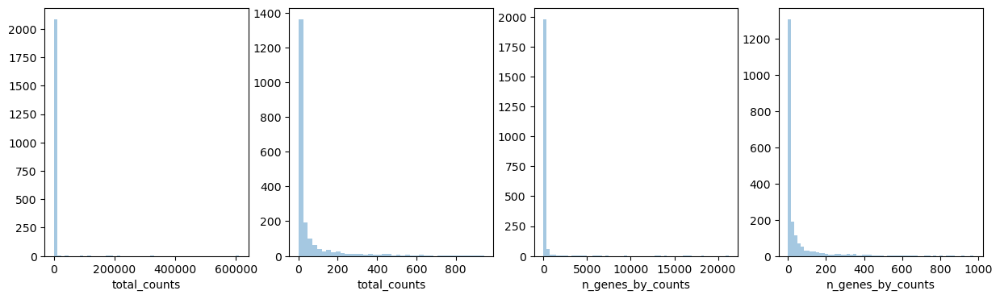

In [83]:
import seaborn as sns
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 1000], kde=False, bins=40, ax=axs[1])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 1000], kde=False, bins=60, ax=axs[3])

In [6]:
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_cells(adata, max_counts=500)
adata = adata[adata.obs["pct_counts_mt"] < 100]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

#cells after MT filter: 909


/usr/local/Caskroom/miniconda/base/envs/dbitseq/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [7]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

/usr/local/Caskroom/miniconda/base/envs/dbitseq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


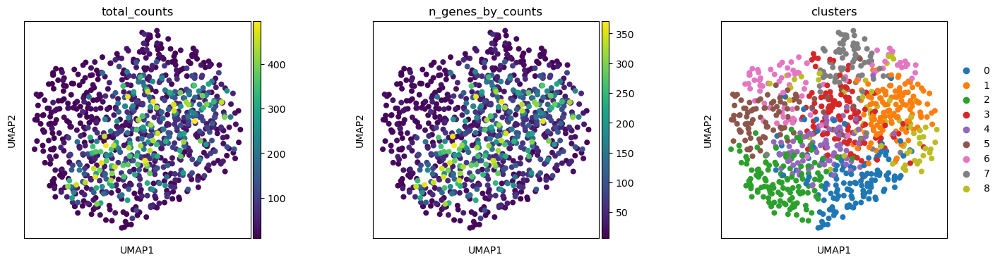

In [8]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

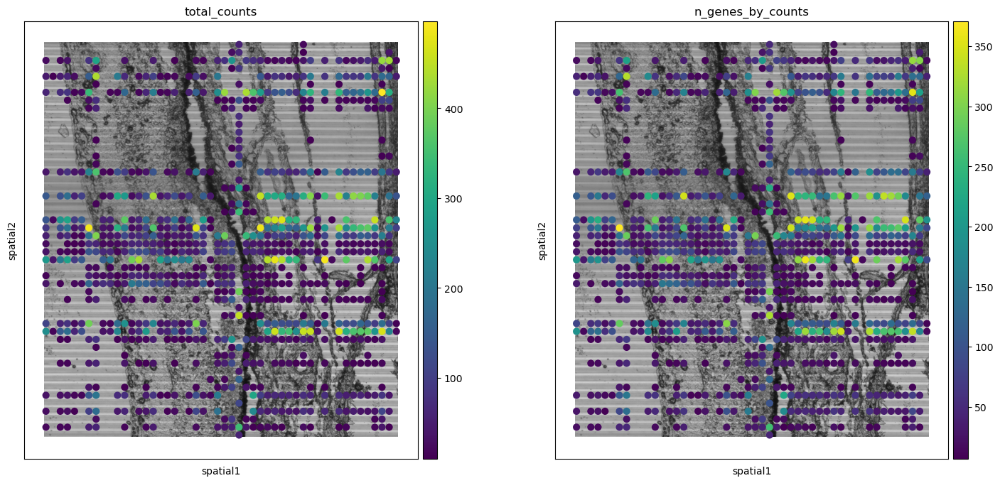

In [9]:
#adata.var_names[np.argmax(adata.X, axis=1)]

adata.uns["spatial"]['test_libID']['scalefactors'] = {'fiducial_diameter_fullres': 288.25050000000005,
                              'spot_diameter_fullres': 50, #178
                              'tissue_hires_scalef': 1,
                              'tissue_lowres_scalef': 1}

plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

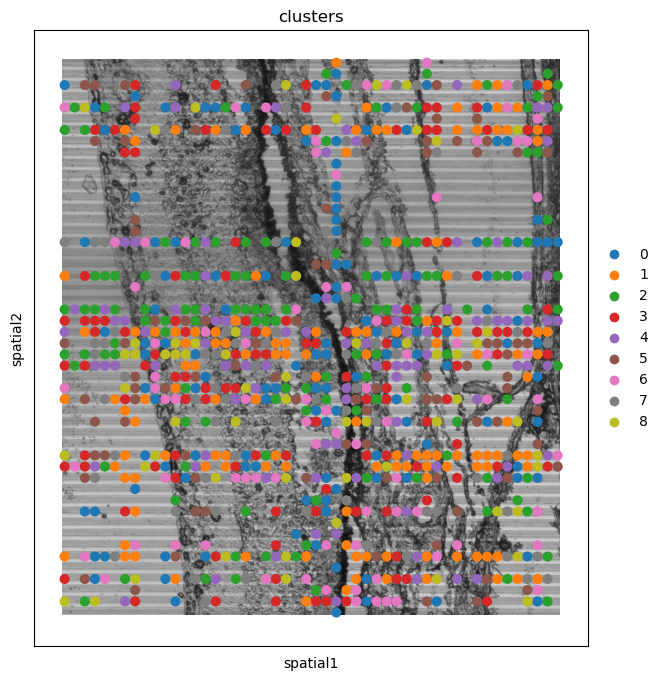

In [10]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1)

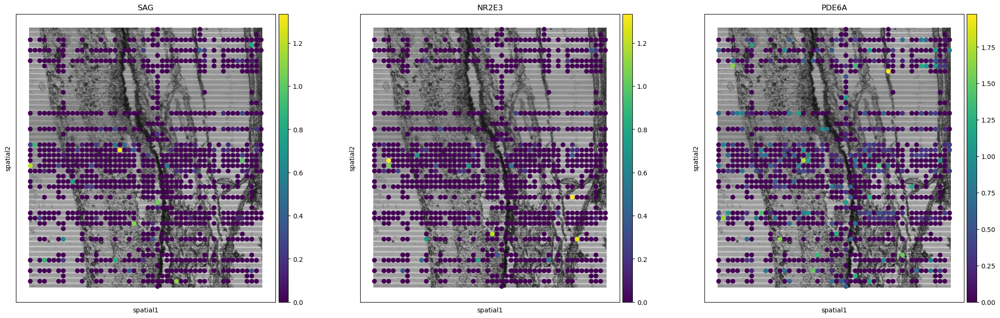

In [11]:
# Rod Genes
sc.pl.spatial(adata, img_key="hires", color=['SAG','NR2E3','PDE6A'])

Rod


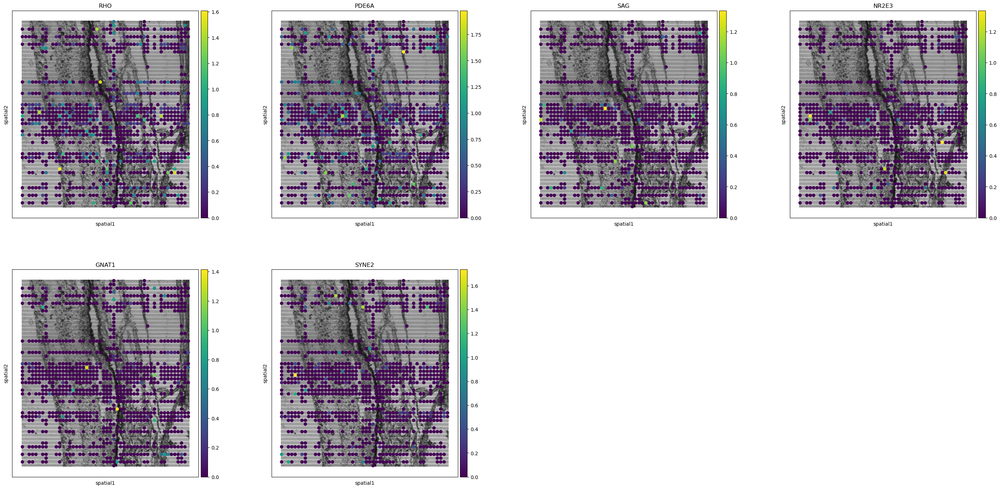

Cone


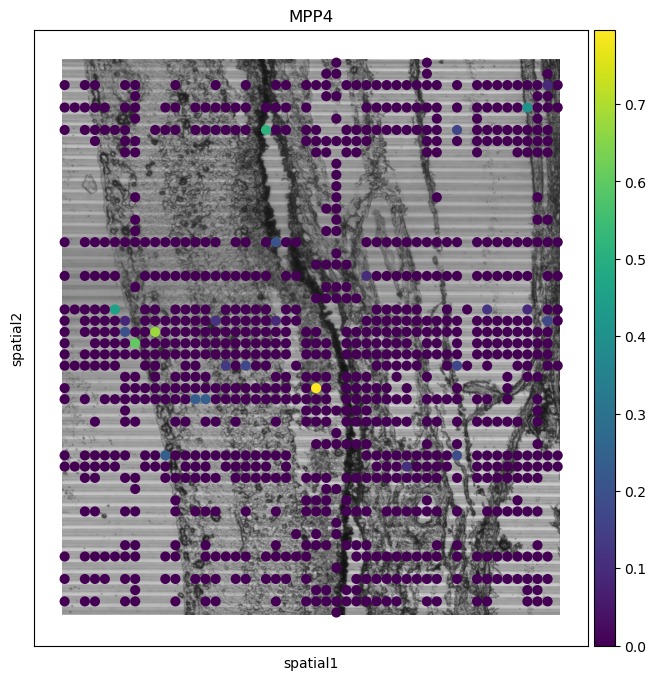

Bipolar


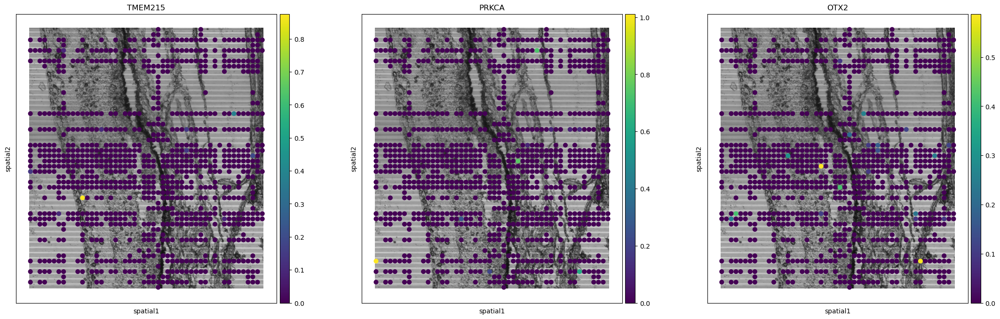

Horizontal


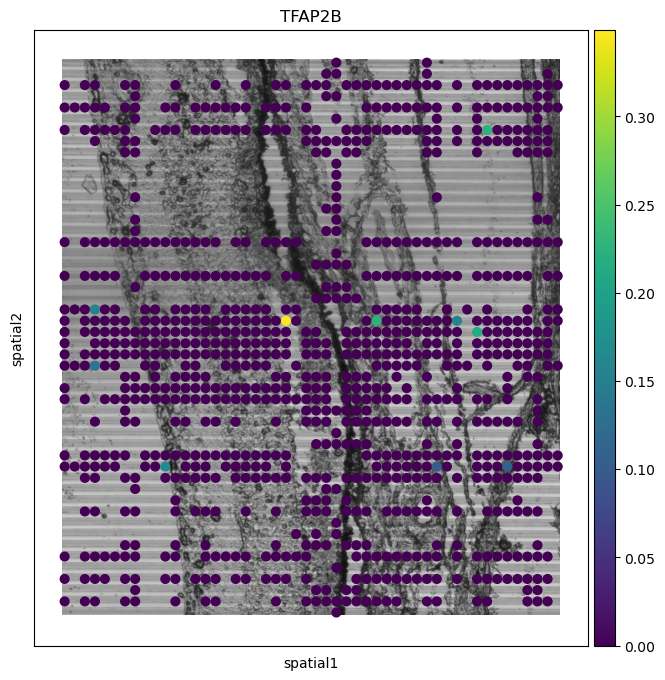

Endothelial
Pericyte


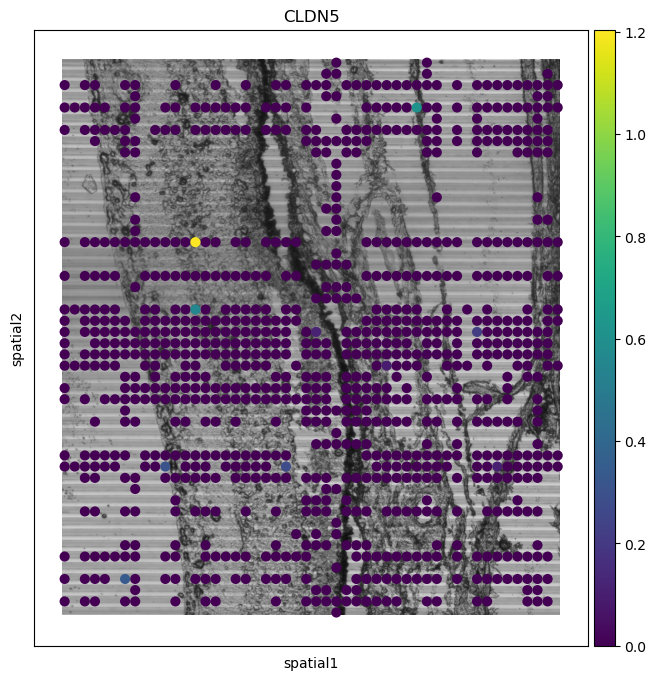

Amacrine


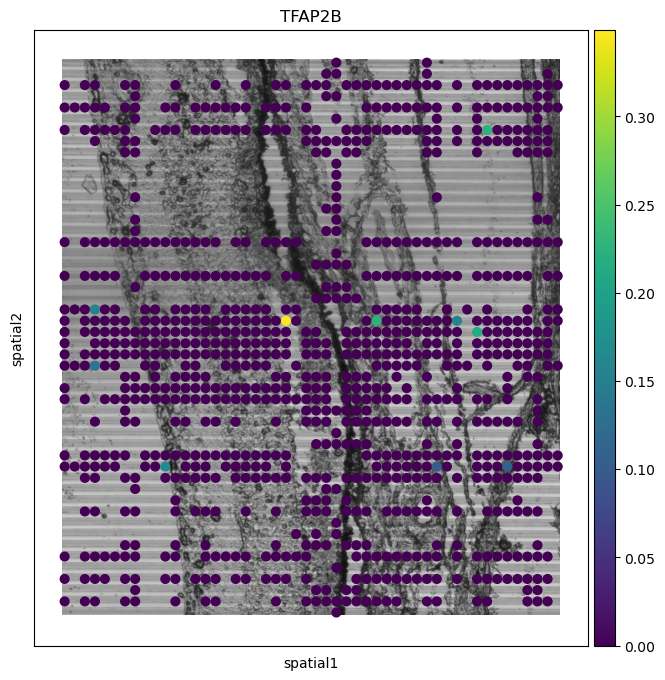

Astrocyte


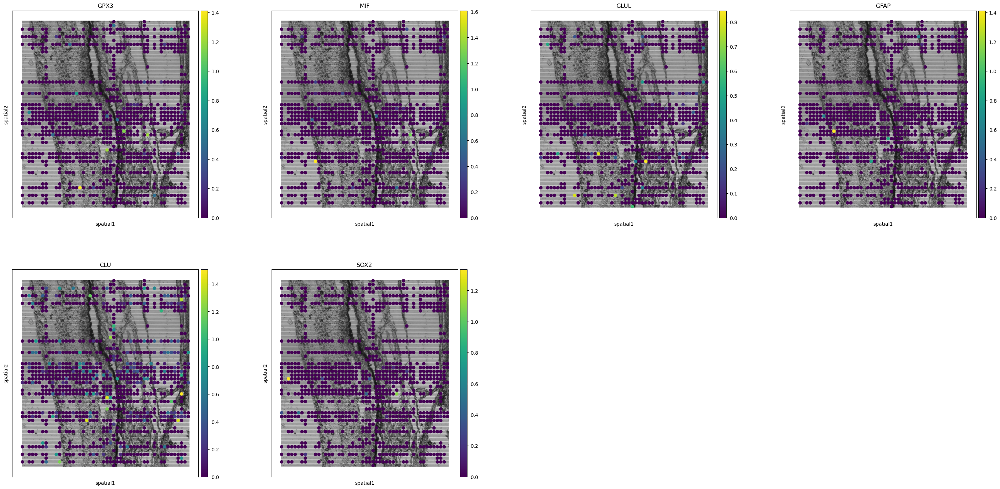

MullerGlia


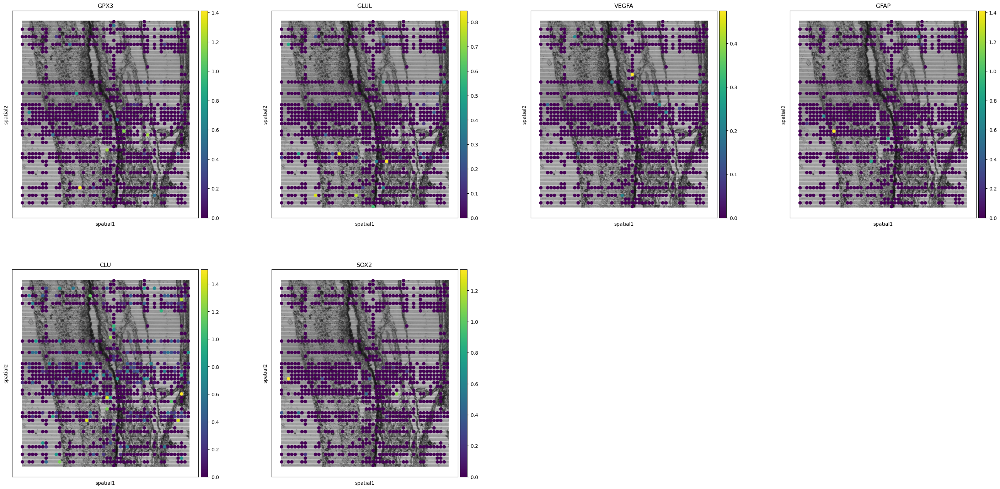

Macroglia


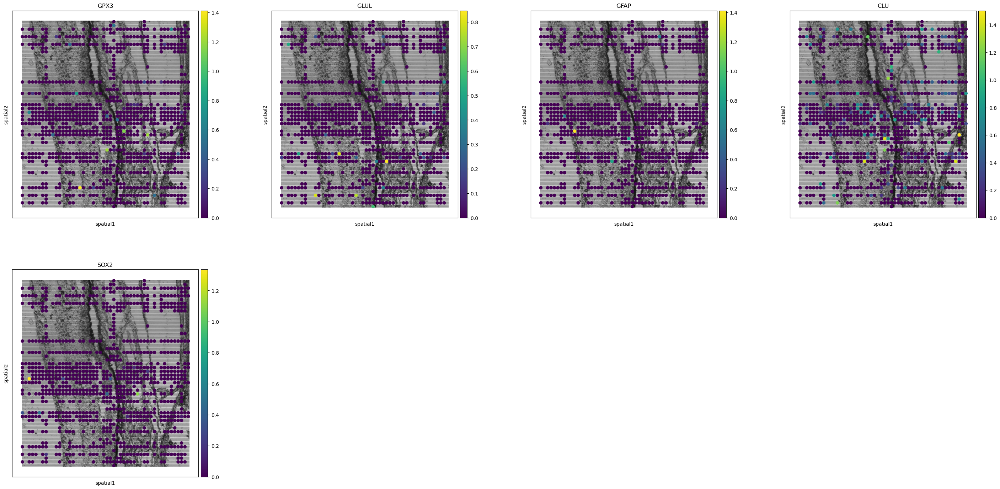

RetinalGanglion


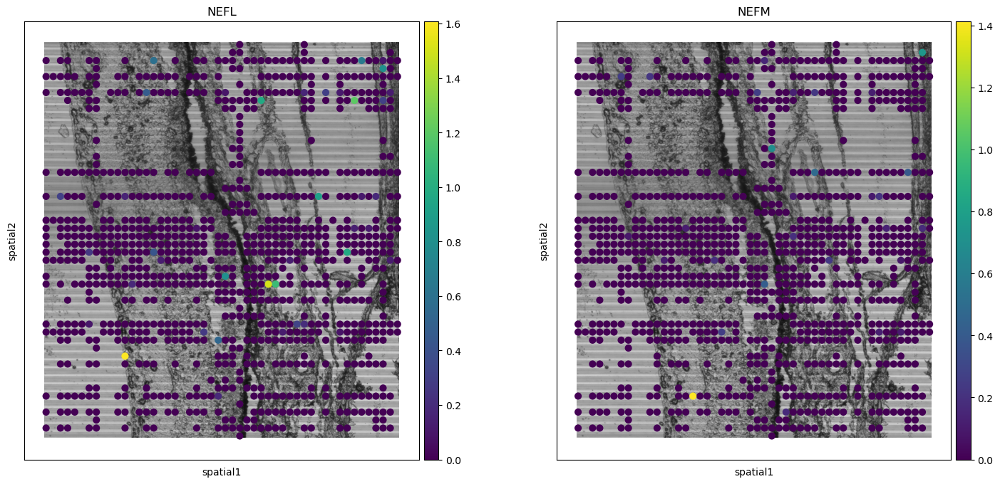

Microglia
TCell


In [13]:
#marker_gene_file = '/Users/mmd47/Dropbox/Workspace/Retina_DBiTseq/Analysis/retinal_celltype_gates.json'
marker_gene_file = '/Users/sydneyzink/Desktop/yale/projects/Generalized_Squidpy_DBiTseq/Analysis/retinal_celltype_gates.json'

try:
    with open(marker_gene_file) as f:
        marker_genes = json.load(f)
except:
    print('Failed to load marker gene list from ' + marker_gene_file)

for celltype in marker_genes:
    print(celltype['cell'])
    try:
        mgs = [g['gene'] for g in celltype['gates']]
        mgs_plot = list(set(mgs) & set(adata.var_names))
        sc.pl.spatial(adata, img_key="hires", color=mgs_plot)
    except:
        continue


In [14]:

marker_genes_2 = dict()
for celltype in marker_genes:
    mgs = [g['gene'] for g in celltype['gates']]
    mgs_plot = list(set(mgs) & set(adata.var_names))
    marker_genes_2[celltype['cell']] = set(mgs_plot)
marker_genes_3 = marker_genes_2
marker_genes_3['Photoreceptor'] = set().union(*[marker_genes_2['Rod'],marker_genes_2['Cone']])

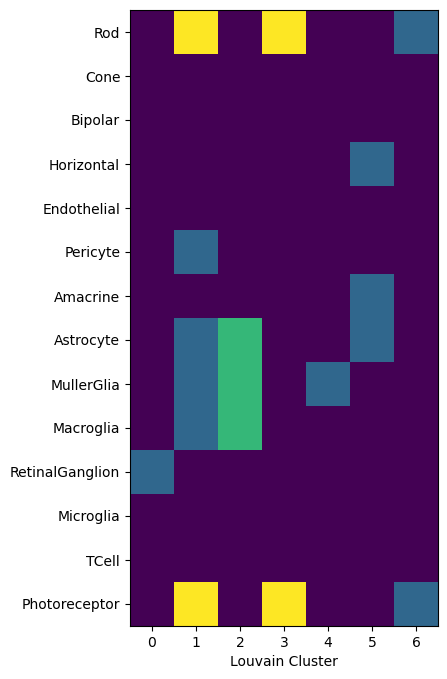

In [15]:
#sc.tl.rank_genes_groups(adata, groupby='leiden')
sc.pp.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.louvain(adata)
sc.tl.rank_genes_groups(adata, groupby='louvain')


marker_genes_2 = dict()
for celltype in marker_genes:
    mgs = [g['gene'] for g in celltype['gates']]
    mgs_plot = list(set(mgs) & set(adata.var_names))
    marker_genes_2[celltype['cell']] = set(mgs_plot)
    
marker_matches = sc.tl.marker_gene_overlap(adata, marker_genes_3)

plt.imshow(marker_matches)
l = [key for key in marker_genes_3.keys()]
plt.yticks(np.arange(len(l)), l)
plt.xlabel('Louvain Cluster')

plt.savefig('figures/MarkerOverlap_Louvain.pdf')
plt.show()

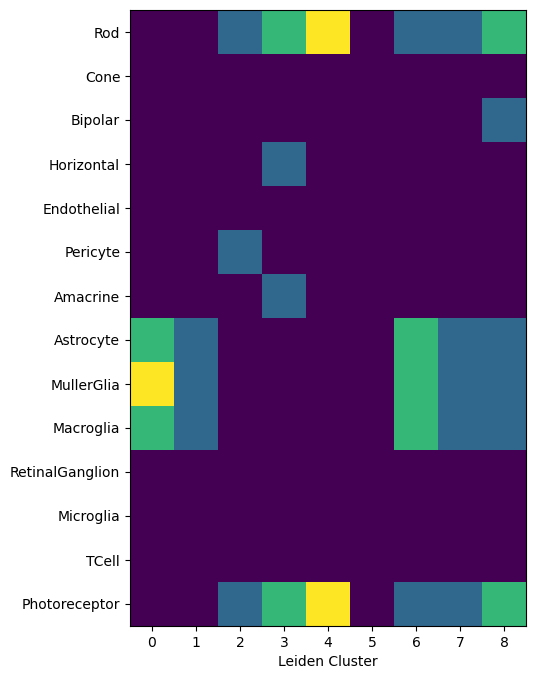

In [16]:
#sc.tl.rank_genes_groups(adata, groupby='leiden')
sc.pp.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.rank_genes_groups(adata, groupby='leiden')




marker_matches = sc.tl.marker_gene_overlap(adata, marker_genes_3)


plt.imshow(marker_matches)
l = [key for key in marker_genes_3.keys()]
plt.yticks(np.arange(len(l)), l)
plt.xlabel('Leiden Cluster')
plt.savefig('figures/MarkerOverlap_Leiden.pdf')
plt.show()

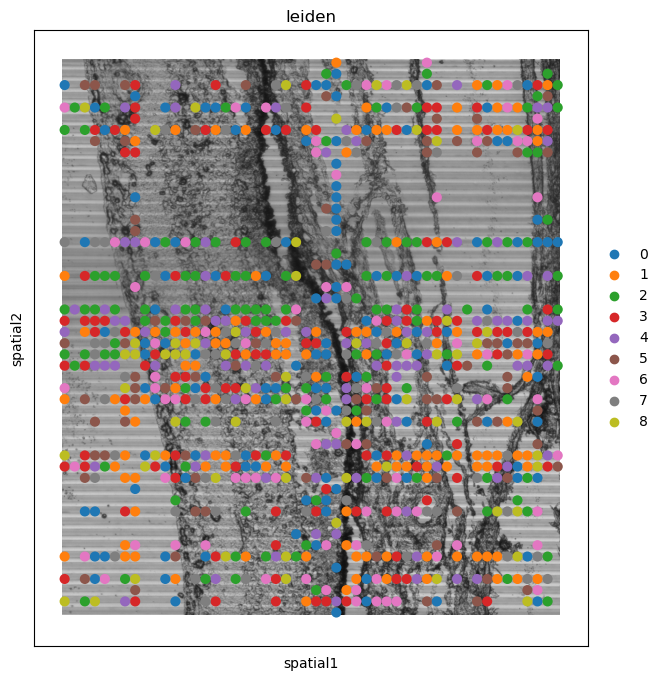

In [17]:
ax = sc.pl.spatial(adata, img_key="hires", color="leiden", size=1, save='LeidenClusters_SpatialMap.pdf')


